In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import tensorflow as tf
from tensorflow.keras import layers

def unet_model(input_size=(512, 512, 3)):  # Updated input size for RGB images
    inputs = tf.keras.Input(input_size)
    c1 = layers.Conv2D(16, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(inputs)
    c1 = layers.Dropout(0.1)(c1)
    c1 = layers.Conv2D(16, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c1)
    p1 = layers.MaxPooling2D((2, 2))(c1)

    c2 = layers.Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p1)
    c2 = layers.Dropout(0.1)(c2)
    c2 = layers.Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c2)
    p2 = layers.MaxPooling2D((2, 2))(c2)

    c3 = layers.Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p2)
    c3 = layers.Dropout(0.2)(c3)
    c3 = layers.Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c3)
    p3 = layers.MaxPooling2D((2, 2))(c3)

    c4 = layers.Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p3)
    c4 = layers.Dropout(0.2)(c4)
    c4 = layers.Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c4)
    p4 = layers.MaxPooling2D((2, 2))(c4)

    c5 = layers.Conv2D(256, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p4)
    c5 = layers.Dropout(0.3)(c5)
    c5 = layers.Conv2D(256, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c5)

    # Expansive path
    u6 = layers.Conv2DTranspose(128, (2, 2), strides=(2, 2), padding='same')(c5)
    u6 = layers.concatenate([u6, c4])
    c6 = layers.Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(u6)
    c6 = layers.Dropout(0.2)(c6)
    c6 = layers.Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c6)

    u7 = layers.Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same')(c6)
    u7 = layers.concatenate([u7, c3])
    c7 = layers.Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(u7)
    c7 = layers.Dropout(0.2)(c7)
    c7 = layers.Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c7)

    u8 = layers.Conv2DTranspose(32, (2, 2), strides=(2, 2), padding='same')(c7)
    u8 = layers.concatenate([u8, c2])
    c8 = layers.Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(u8)
    c8 = layers.Dropout(0.1)(c8)
    c8 = layers.Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c8)

    u9 = layers.Conv2DTranspose(16, (2, 2), strides=(2, 2), padding='same')(c8)
    u9 = layers.concatenate([u9, c1], axis=3)
    c9 = layers.Conv2D(16, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(u9)
    c9 = layers.Dropout(0.1)(c9)
    c9 = layers.Conv2D(16, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c9)

    outputs = layers.Conv2D(1, (1, 1), activation='sigmoid')(c9)

    model = tf.keras.Model(inputs=[inputs], outputs=[outputs])
    return model


In [3]:
model = unet_model()
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
model.summary()


Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 512, 512,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d (Conv2D)     │ (None, 512, 512,  │        448 │ input_layer[0][0] │
│                     │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout (Dropout)   │ (None, 512, 512,  │          0 │ conv2d[0][0]      │
│                     │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_1 (Conv2D)   │ (None, 512, 512,  │      2,320 │ dropout[0][0]     │
│                     │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d       │ (None, 256, 256,  │          0 │ conv2d_1[0][0]    │
│ (MaxPooling2D)      │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_2 (Conv2D)   │ (None, 256, 256,  │      4,640 │ max_pooling2d[0]… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_1 (Dropout) │ (None, 256, 256,  │          0 │ conv2d_2[0][0]    │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_3 (Conv2D)   │ (None, 256, 256,  │      9,248 │ dropout_1[0][0]   │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_1     │ (None, 128, 128,  │          0 │ conv2d_3[0][0]    │
│ (MaxPooling2D)      │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_4 (Conv2D)   │ (None, 128, 128,  │     18,496 │ max_pooling2d_1[… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_2 (Dropout) │ (None, 128, 128,  │          0 │ conv2d_4[0][0]    │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_5 (Conv2D)   │ (None, 128, 128,  │     36,928 │ dropout_2[0][0]   │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_2     │ (None, 64, 64,    │          0 │ conv2d_5[0][0]    │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_6 (Conv2D)   │ (None, 64, 64,    │     73,856 │ max_pooling2d_2[… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_3 (Dropout) │ (None, 64, 64,    │          0 │ conv2d_6[0][0]    │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_7 (Conv2D)   │ (None, 64, 64,    │    147,584 │ dropout_3[0][0]   │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_3     │ (None, 32, 32,    │          0 │ conv2d_7[0][0]  

 Total params: 1,941,105 (7.40 MB)

 Trainable params: 1,941,105 (7.40 MB)

 Non-trainable params: 0 (0.00 B)

In [83]:
import os
import sys
import numpy as np
import pandas as pd
import json
import matplotlib.pyplot as plt
from plotly import express as px
from PIL import Image

current_dir = os.getcwd()

parent_dir = os.path.dirname(current_dir)

if parent_dir not in sys.path:
    sys.path.append(parent_dir)

# Some helpful lists for data access.
from preprocessing import DATA_ROOT, DATA_FOLDERS, DATA_SUBFOLDERS, SEGMENTATION_FILES, SEGMENTATION_NAMES 

# some helpful methods
from preprocessing import load_labels, image_generator, image_path_generator, batch_generator, load_segmentation, merge_dicts

In [84]:
seg_dfs = load_segmentation("../../Hemorrhage Segmentation Project")

loaded epidural segmentation data
loaded intraparenchymal segmentation data
loaded multiple segmentation data
loaded subarachnoid segmentation data
loaded subdural-1 segmentation data
loaded subdural-2 segmentation data


In [85]:
seg_dfs.keys()

dict_keys(['epidural', 'intraparenchymal', 'multiple', 'subarachnoid', 'subdural-1', 'subdural-2'])

In [86]:
def series_info(series):
    info = {
        'dtype': series.dtype,
        'count': series.count()  # Count of non-null entries
    }
    return info

In [87]:
def validate_column(dataframe, column_name):
    # Check each entry in the specified column
    for index, item in enumerate(dataframe[column_name]):
        if not isinstance(item, list):
            print(f"Row {index} is not a list.")
            return False
        
        for dic in item:
            # Check if each element in the list is a dictionary with 'x' and 'y' keys
            if not (isinstance(dic, dict) and 'x' in dic and 'y' in dic):
                print(f"Row {index} does not contain dictionaries with 'x' and 'y' keys.")
                return False
            
            # Check if the values of 'x' and 'y' are floats
            if not (isinstance(dic['x'], float) and isinstance(dic['y'], float)):
                print(f"Row {index} contains non-float values for 'x' or 'y'.")
                return False

    print("All entries are correctly formatted.")
    return True

In [88]:
validate_column(seg_dfs['subdural-2'], "Correct Label")

Row 0 does not contain dictionaries with 'x' and 'y' keys.


False

In [89]:
seg_dfs['subdural-2']['Correct Label'].loc["ID_c0bfa10d4"]

nan

In [90]:
seg_dfs['subdural-2']['Correct Label'].loc["ID_0061cb462"] != "NaN"

Origin
ID_0061cb462    True
ID_0061cb462    True
Name: Correct Label, dtype: bool

In [91]:
# def merge_seg_dfs():
#     df1 = pd.concat([seg_dfs['epidural'], 'intraparenchymal'], axis=0, ignore_index=False)
#     df2 = pd.concat([seg_dfs['multiple'], 'subarachnoid'], axis=0, ignore_index=False)
#     df3 = pd.concat([seg_dfs['subdural-1'], 'subdural-2'], axis=0, ignore_index=False)

#     return pd.concat([df1, df2, df3], axis=0, ignore_index=False)


In [92]:
import json
import cv2


# A function to convert polygon coordinates to a mask
def polygons_to_mask(polygons, image_shape):
    # Initialize the mask to be completely black
    mask = np.zeros(image_shape[:2], dtype=np.uint8)
    
    # If the list is not empty
    if polygons:
        # Scale the polygon points from relative to absolute coordinates
        points = np.array(
            [[int(p['x'] * image_shape[1]), int(p['y'] * image_shape[0])] for p in polygons],
            dtype=np.int32
        )
        
        # Draw the polygon onto the mask
        cv2.fillPoly(mask, [points], 255)
    
    return mask

# def create_mask_from_polygons(row, image_shape):
#     polygons = json.loads(row['Majority Label'])
#     return polygons_to_mask(polygons, image_shape)

def create_mask_from_polygons(row, image_shape):
    
    if(isinstance(row['Correct Label'], pd.Series)):
        polygons = []
    elif isinstance(row['Correct Label'], list):
        polygons = row['Correct Label']
    else:
        polygons = [row['Majority Label']]
        
    if(len(polygons) != 0 and isinstance(polygons[0], list)):
        polygons = polygons[0]
        
    return polygons_to_mask(polygons, image_shape)

def mask_to_polygons(mask):
    # Find contours in the mask
    contours, _ = cv2.findContours(mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    polygons = []
    
    for contour in contours:
        # Convert contour points to the same format as your original polygons
        # Assuming original format was a list of dicts with 'x' and 'y' keys
        # The contour points are in (x, y) order and need to be normalized by image width and height
        # The division by image_shape[1] or image_shape[0] is assumed to be width and height respectively
        contour = contour.squeeze(1)  # Remove redundant dimension
        polygon = [{'x': point[0] / mask.shape[1], 'y': point[1] / mask.shape[0]} for point in contour]
        polygons.append(polygon)
    
    return polygons


In [93]:
import matplotlib.pyplot as plt
import numpy as np

def plot_image_with_masks(image, masks, labels=None, alpha=0.5):
    """
    Plots a 512x512 image with one or more masks overlaid on top as red scatterplot points.

    Parameters:
    - image: A 512x512 numpy array representing the image.
    - masks: A list of numpy arrays where each array represents a mask.
    - labels: A list of strings representing labels for each mask.
    - alpha: A float indicating the opacity of the masks.
    """

    # Ensure the image is in the correct format
    if image.dtype != np.uint8:
        if image.max() <= 1.0:
            image = (image * 255).astype(np.uint8)
        else:
            image = image.astype(np.uint8)
    
    # Plot the image
    plt.figure(figsize=(6, 6))
    plt.imshow(image, cmap='gray')
    plt.axis('off')

    # Overlay each mask in red with the specified alpha
    for i, mask in enumerate(masks):
        # Find the mask's boundary points
        ys, xs = np.where(mask > 0)

        # Overlay red points on the mask's boundary locations
        plt.scatter(xs, ys, color='red', alpha=alpha, s=1)  # s is the size of the points
        # Add a label for each mask if provided
        if labels and i < len(labels) and len(xs) > 0 and len(ys) > 0:
            # Position the label at the median of the boundary points
            label_x, label_y = np.median(xs), np.median(ys)
            plt.text(label_x, label_y, labels[i], color='white', fontsize=12,
                     ha='center', va='center', bbox=dict(facecolor='red', alpha=alpha, edgecolor='none', boxstyle='round,pad=0.5'))

    plt.show()

In [94]:
def generate_data(data_gen, seg_dfs, num_batches, hemorrhage_type, switch_point):
    # Generate data until the switch point for training
    for batch_index in range(num_batches):
        images, masks = [], []

        # Get the next batch from the generator
        batch_images, batch_ids = next(data_gen)
        batch_masks = []

        # Process each image in the batch
        for img, img_id in zip(batch_images, batch_ids):
            # Access the segmentation dataframe for the given type
            seg_df = seg_dfs[hemorrhage_type]

            # If the ID exists in the segmentation dataframe, handle potential multiple rows
            if img_id in seg_df.index:
                rows = seg_df.loc[img_id]
                individual_masks = []

                # Check if rows is a DataFrame (multiple entries) or a single Series (single entry)
                if isinstance(rows, pd.DataFrame):
                    for _, row in rows.iterrows():
                        mask = create_mask_from_polygons(row, img.shape)
                        individual_masks.append(mask)
                else:  # Single Series
                    mask = create_mask_from_polygons(rows, img.shape)
                    individual_masks.append(mask)

                # Combine individual masks into a single mask
                if individual_masks:
                    mask = np.maximum.reduce(individual_masks)
                else:
                    mask = np.zeros(img.shape[:2], dtype=np.uint8)
            else:
                # If no segmentation data is available for this image, create an empty mask
                mask = np.zeros(img.shape[:2], dtype=np.uint8)

            batch_masks.append(mask)

        # Add the processed images and masks to the epoch data
        images.extend(batch_images)
        masks.extend(batch_masks)

        # If we reached the switch point, the remaining data will be used for testing
        if batch_index == switch_point:
            # Transition to test data
            yield (np.array(images, dtype=np.float32), np.array(masks, dtype=np.uint8)), 'test'
        else:
            # Continue yielding training data
            yield (np.array(images, dtype=np.float32), np.array(masks, dtype=np.uint8)), 'train'


# def generate_data(data_gen, seg_dfs, num_batches, hemorrhage_type, switch_point):
#     # Generate data until the switch_point for training
#     for batch_index in range(num_batches):
#         images, masks = [], []

#         # Get the next batch from the generator

#         batch_images, batch_ids = next(data_gen)
#         batch_masks = []

#         # Process each image in the batch
#         for img, img_id in zip(batch_images, batch_ids):
#             # Access the segmentation dataframe for the given type
#             seg_df = seg_dfs[hemorrhage_type]

#             # If the ID exists in the segmentation dataframe, create the mask
# #             print(f"Searching for {img_id}")
#             if img_id in seg_df.index:
#                 print(f"Found {img_id}")
#                 row = seg_df.loc[img_id]
#                 mask = create_mask_from_polygons(row, img.shape)
#             else:
#                 print(f"id: {img_id} not in index")
#                 # If no segmentation data is available for this image, create an empty mask
#                 mask = np.zeros(img.shape[:2], dtype=np.uint8)

#             batch_masks.append(mask)

#         # Add the processed images and masks to the epoch data
        


#         images.extend(batch_images)
#         masks.extend(batch_masks)
#         print(f"generaetd masks: {masks}")

        
#         # If we reached the switch point, the remaining data will be used for testing
#         if batch_index == switch_point:
#             # Transition to test data
#             yield (np.array(images, dtype=np.float32), np.array(masks, dtype=np.uint8)), 'test'
#         else:
#             # Continue yielding training data
#             yield (np.array(images, dtype=np.float32), np.array(masks, dtype=np.uint8)), 'train'


In [95]:
def labeled_batch_gen(path):
    df = pd.read_csv(path)
    
    full_dat = ([], [])
    for f_id in df["Origin"]:
        full_dat[0].append(np.array(Image.open("../../renders/epidural/max_contrast_window/" + f_id)))
        full_dat[1].append(f_id.replace(".jpg", ""))
    print(full_dat[1])
    return iter([full_dat])
    

In [96]:
total_images = 32000  # Total number of images in the dataset
train_ratio = 0.8
images_per_epoch = 100  # Total images generated in one epoch
num_epochs = 1
train_epochs = int(num_epochs * train_ratio)
switch_point = train_epochs * images_per_epoch

data_gen = batch_generator('../../renders/epidural/brain_bone_window', batch_size=images_per_epoch)
# data_gen = labeled_batch_gen("../../Hemorrhage Segmentation Project/Results_Epidural Hemorrhage Detection_2020-11-16_21.31.26.148.csv")
data = generate_data(data_gen, seg_dfs, num_epochs, "epidural", switch_point)

# for data_batch, data_type in data:
#     if data_type == 'train':
#         # Use data_batch for training
#         pass
#     elif data_type == 'test':
#         # Use data_batch for testing
#         pass


In [97]:
full = next(labeled_batch_gen("../../Hemorrhage Segmentation Project/Results_Epidural Hemorrhage Detection_2020-11-16_21.31.26.148.csv"))

['ID_004c4b319', 'ID_0237b835f', 'ID_02e2d273d', 'ID_02f37ce84', 'ID_02f37ce84', 'ID_03c6a01ca', 'ID_03c6a01ca', 'ID_045196c9f', 'ID_0513bfa29', 'ID_053172482', 'ID_0558fa70d', 'ID_056e14224', 'ID_0635a1ebf', 'ID_0635a1ebf', 'ID_065109324', 'ID_065109324', 'ID_065109324', 'ID_073dd4756', 'ID_07ad70ea0', 'ID_07c565939', 'ID_08282aff3', 'ID_08282aff3', 'ID_0a5b19112', 'ID_0b6508ef5', 'ID_0c516592b', 'ID_0c6724d68', 'ID_0c6724d68', 'ID_0d9807d85', 'ID_0d9807d85', 'ID_0ec8e5dfc', 'ID_0ed10ec08', 'ID_0f91fde95', 'ID_1147d3c37', 'ID_1166d7389', 'ID_1193c693f', 'ID_1207044a4', 'ID_12534e78f', 'ID_127454b26', 'ID_161aac5a9', 'ID_161aac5a9', 'ID_161fb5a57', 'ID_162be0813', 'ID_16b052b18', 'ID_16e2a2520', 'ID_177a58d49', 'ID_1805c8009', 'ID_187239b3e', 'ID_18aa1e866', 'ID_19e42dec8', 'ID_1a4439d30', 'ID_1acf75b05', 'ID_1b00cdf51', 'ID_1b04e9681', 'ID_1b1a329b9', 'ID_1bf5cec37', 'ID_1bf5cec37', 'ID_1c38da642', 'ID_1d5a459c9', 'ID_1d9a44cbc', 'ID_1de9cf2cf', 'ID_1ef06a053', 'ID_1f054a3fd', 'ID_1f0

----------------


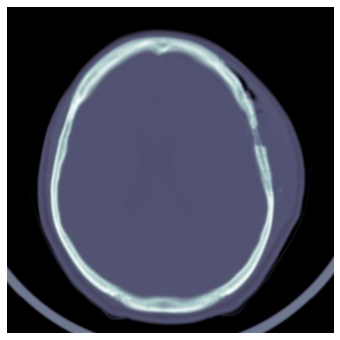

In [98]:
sample = next(data)

plot_image_with_masks(sample[0][0][0], [sample[0][1][0]])


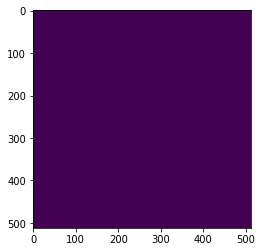

In [99]:
plt.imshow(sample[0][1][0])

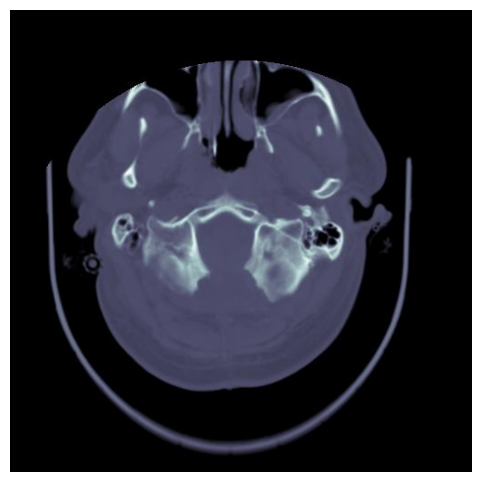

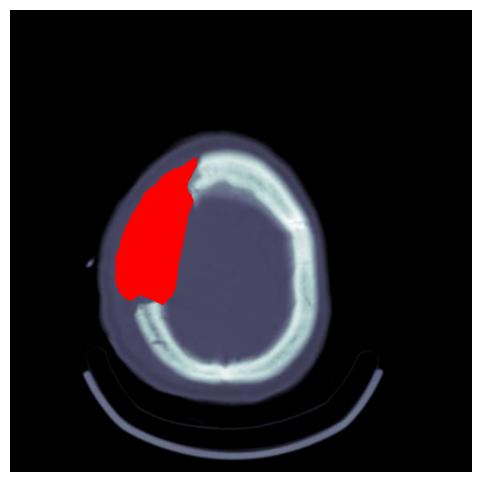

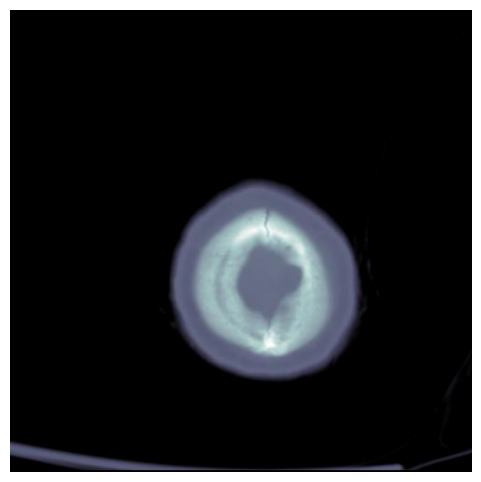

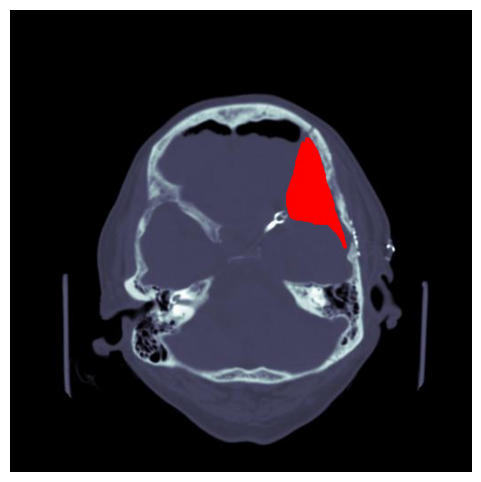

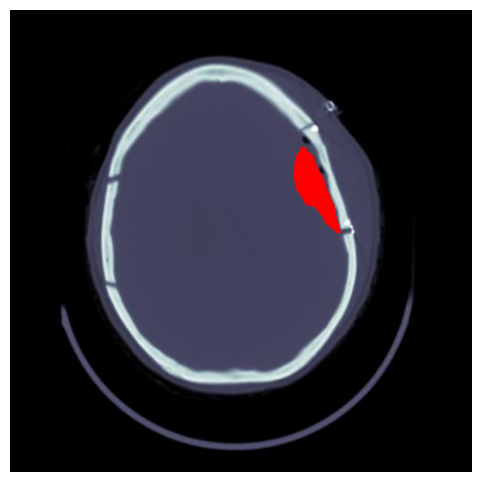

...

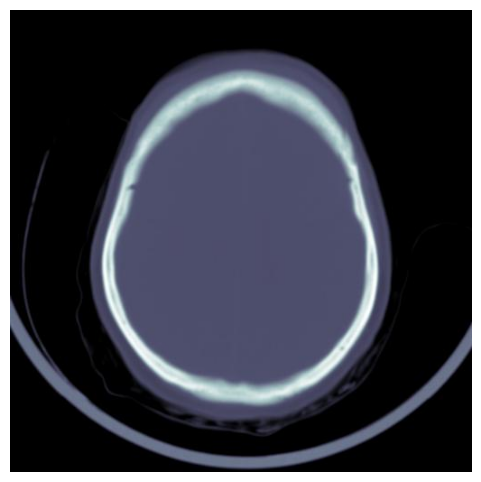

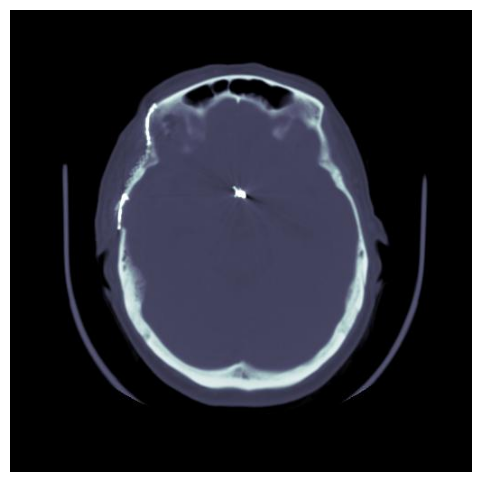

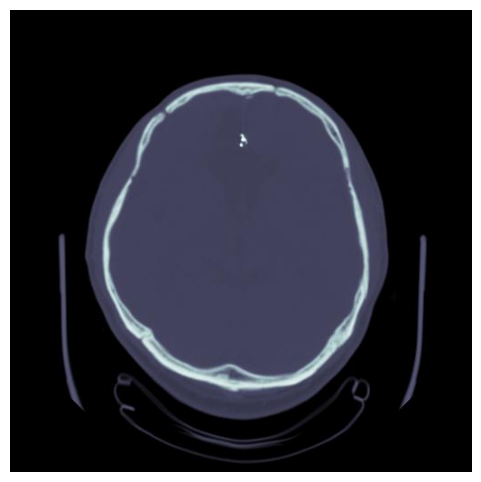

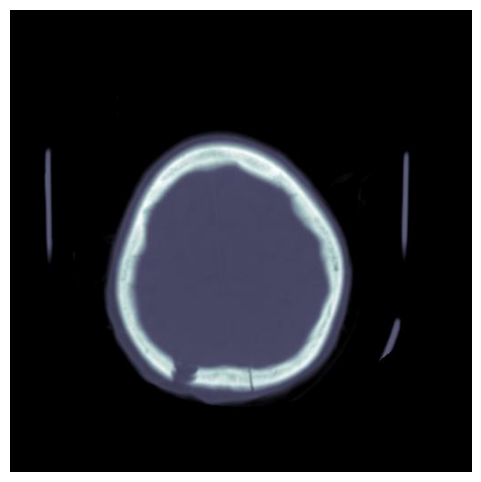

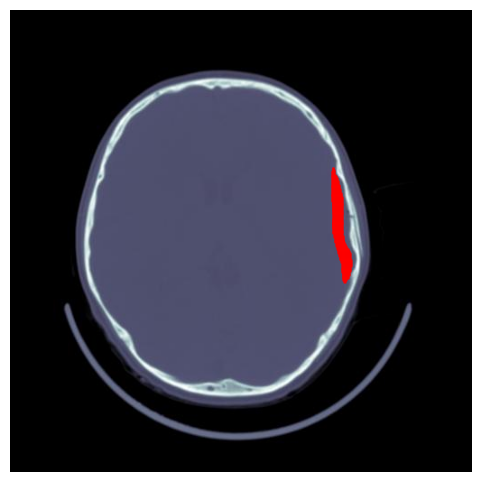

In [20]:
for i in range(20):
    plot_image_with_masks(sample[0][0][i], [sample[0][1][i]])

    

In [21]:
px.imshow(sample[0][1][0])

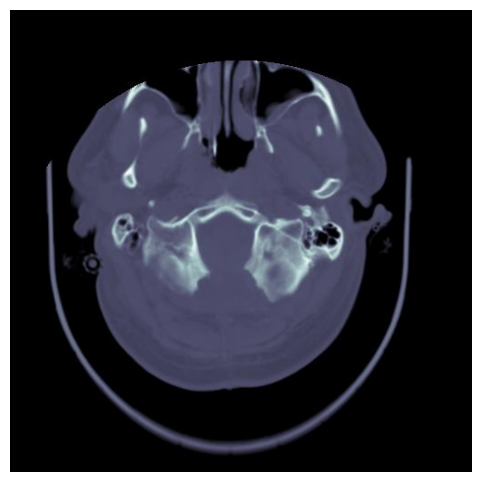

In [22]:
plot_image_with_masks(sample[0][0][0], [sample[0][1][0]])



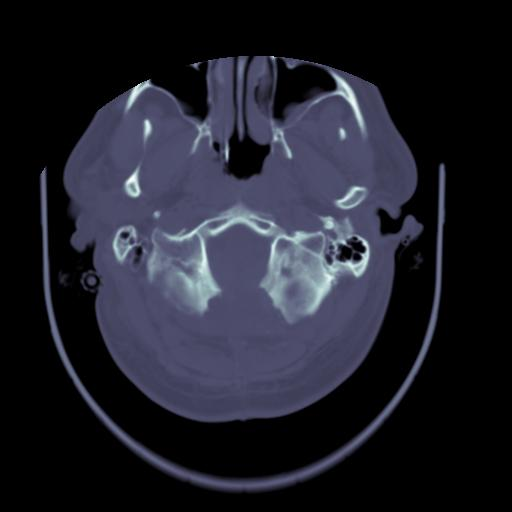

In [23]:
px.imshow(sample[0][0][0])

In [24]:
sample = next(data_gen)
sample

(array([[[[ 0,  0,  0],
          [ 0,  0,  0],
          [ 0,  0,  0],
          ...,
          [ 0,  0,  0],
          [ 0,  0,  0],
          [ 0,  0,  0]],
 
         [[ 0,  0,  0],
          [ 0,  0,  0],
          [ 0,  0,  0],
          ...,
          [ 0,  0,  0],
          [ 0,  0,  0],
          [ 0,  0,  0]],
 
         [[ 0,  0,  0],
          [ 0,  0,  0],
          [ 0,  0,  0],
          ...,
          [ 0,  0,  0],
          [ 0,  0,  0],
          [ 0,  0,  0]],
 
         ...,
 
         [[ 0,  0,  0],
          [ 0,  0,  0],
          [ 0,  0,  0],
          ...,
          [ 0,  0,  0],
          [ 0,  0,  0],
          [ 0,  0,  0]],
 
         [[ 0,  0,  0],
          [ 0,  0,  0],
          [ 0,  0,  0],
          ...,
          [ 0,  0,  0],
          [ 0,  0,  0],
          [ 0,  0,  0]],
 
         [[ 0,  0,  0],
          [ 0,  0,  0],
          [ 0,  0,  0],
          ...,
          [ 0,  0,  0],
          [ 0,  0,  0],
          [ 0,  0,  0]]],
 
 
        [

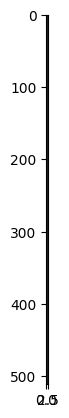

In [25]:
plt.imshow(sample[0][0][4])

In [26]:
# Example for training
# results = model.fit(x_train, y_train, validation_split=0.1, epochs=50, batch_size=16)


In [27]:
next(data_gen)

(array([[[[  0,   0,   0],
          [  0,   0,   0],
          [  0,   0,   0],
          ...,
          [  0,   0,   0],
          [  0,   0,   0],
          [  0,   0,   0]],
 
         [[  0,   0,   0],
          [  0,   0,   0],
          [  0,   0,   0],
          ...,
          [  0,   0,   0],
          [  0,   0,   0],
          [  0,   0,   0]],
 
         [[  0,   0,   0],
          [  0,   0,   0],
          [  0,   0,   0],
          ...,
          [  0,   0,   0],
          [  0,   0,   0],
          [  0,   0,   0]],
 
         ...,
 
         [[  0,   0,   0],
          [  0,   0,   0],
          [  0,   0,   0],
          ...,
          [  0,   0,   0],
          [  0,   0,   0],
          [  0,   0,   0]],
 
         [[  0,   0,   0],
          [  0,   0,   0],
          [  0,   0,   0],
          ...,
          [  0,   0,   0],
          [  0,   0,   0],
          [  0,   0,   0]],
 
         [[  0,   0,   0],
          [  0,   0,   0],
          [  0,   0,   0],
   